In [24]:
# Import necessary packages
import keras
import tensorflow.keras.backend as K
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import numpy as np
import cv2
import sklearn

import os
import seaborn as sns
import time
import pickle

sns.set()

# This sets a common size for all the figures we will draw.
plt.rcParams['figure.figsize'] = [10, 7]

In [25]:
CSV_PATH = 'sample_labels.csv'

In [26]:
data = pd.read_csv(CSV_PATH)
data.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
0,00000013_005.png,Emphysema|Infiltration|Pleural_Thickening|Pneu...,5,13,060Y,M,AP,3056,2544,0.139,0.139
1,00000013_026.png,Cardiomegaly|Emphysema,26,13,057Y,M,AP,2500,2048,0.168,0.168
2,00000017_001.png,No Finding,1,17,077Y,M,AP,2500,2048,0.168,0.168
3,00000030_001.png,Atelectasis,1,30,079Y,M,PA,2992,2991,0.143,0.143
4,00000032_001.png,Cardiomegaly|Edema|Effusion,1,32,055Y,F,AP,2500,2048,0.168,0.168


In [27]:
pathology_list = ['Cardiomegaly','Emphysema','Effusion','Hernia','Nodule','Pneumothorax','Atelectasis','Pleural_Thickening','Mass','Edema','Consolidation','Infiltration','Fibrosis','Pneumonia']

for pathology in pathology_list :
    data[pathology] = data['Finding Labels'].apply(lambda x: 1 if pathology in x else 0)
    
data['No Findings'] = data['Finding Labels'].apply(lambda x: 1 if 'No Finding' in x else 0)

In [28]:
data=data[data['No Findings']!=1]

In [29]:
selected_columns = [
    'Image Index', 'Patient ID',
    'Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Nodule', 
    'Pneumothorax', 'Atelectasis', 'Pleural_Thickening', 'Mass', 
    'Edema', 'Consolidation', 'Infiltration', 'Fibrosis', 'Pneumonia'
]
df=data[selected_columns]
df

,Image Index,Patient ID,Cardiomegaly,Emphysema,Effusion,Hernia,Nodule,Pneumothorax,Atelectasis,Pleural_Thickening,Mass,Edema,Consolidation,Infiltration,Fibrosis,Pneumonia
0,00000013_005.png,13,0,1,0,0,0,1,0,1,0,0,0,1,0,0
1,00000013_026.png,13,1,1,0,0,0,0,0,0,0,0,0,0,0,0
3,00000030_001.png,30,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,00000032_001.png,32,1,0,1,0,0,0,0,0,0,1,0,0,0,0
5,00000040_003.png,40,0,0,0,0,0,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5595,00030636_014.png,30636,0,0,1,0,0,1,1,0,0,0,0,0,0,0
5598,00030650_002.png,30650,0,0,0,0,0,1,0,0,0,0,0,1,0,0
5599,00030695_002.png,30695,0,0,0,0,0,0,1,0,0,0,0,0,0,0
5602,00030786_005.png,30786,1,1,1,0,0,0,0,0,0,0,0,0,0,0


In [30]:
from sklearn.model_selection import train_test_split

train_val_data, test_df = train_test_split(df, test_size=0.3, random_state=42)

# Next, split the train_val_data into training and validation sets
train_df, val_df = train_test_split(train_val_data, test_size=0.25, random_state=42)  # 0.25 x 0.8 = 0.2

# Now, 'train_data' contains 60% of the data, 'val_data' contains 20%, and 'test_data' contains 20%
print(f"Train size: {len(train_df)}, Validation size: {len(val_df)}, Test size: {len(test_df)}")

Train size: 1344, Validation size: 449, Test size: 769


# Data Exploration
we will work with chest x-ray images taken from the public [ChestX-ray8 dataset](https://arxiv.org/abs/1705.02315). In this notebook, you'll get a chance to explore this dataset and familiarize yourself with .


In [31]:
train_df.columns

Index(['Image Index', 'Patient ID', 'Cardiomegaly', 'Emphysema', 'Effusion',
       'Hernia', 'Nodule', 'Pneumothorax', 'Atelectasis', 'Pleural_Thickening',
       'Mass', 'Edema', 'Consolidation', 'Infiltration', 'Fibrosis',
       'Pneumonia'],
      dtype='object')

In [32]:
print(f"Train set: The total patient ids are {train_df['Patient ID'].count()}, from those the unique ids are {train_df['Patient ID'].value_counts().shape[0]} ")
print(f"Validation set: The total patient ids are {val_df['Patient ID'].count()}")
print(f"Test set: The total patient ids are {test_df['Patient ID'].count()}")

Train set: The total patient ids are 1344, from those the unique ids are 1140 
Validation set: The total patient ids are 449
Test set: The total patient ids are 769


### Preventing Data Leakage
It is worth noting that our dataset contains multiple images for each patient. This could be the case, for example, when a patient has taken multiple X-ray images at different times during their hospital visits. In our data splitting, we have ensured that the split is done on the patient level so that there is no data "leakage" between the train, validation, and test datasets.

In [33]:
def check_for_leakage(df1, df2, patient_col):
    """
    Return True if there any patients are in both df1 and df2.

    Args:
        df1 (dataframe): dataframe describing first dataset
        df2 (dataframe): dataframe describing second dataset
        patient_col (str): string name of column with patient IDs
    
    Returns:
        leakage (bool): True if there is leakage, otherwise False
    """

    ### START CODE HERE (REPLACE INSTANCES OF 'None' with your code) ###
    
    df1_patients_unique = set(df1[patient_col])
    df2_patients_unique = set(df2[patient_col])
    
    patients_in_both_groups = list(df1_patients_unique.intersection(df2_patients_unique))

    # leakage contains true if there is patient overlap, otherwise false.
    leakage = len(patients_in_both_groups) > 0 
    
    ### END CODE HERE ###
    
    return leakage

In [34]:
print("leakage between train and test: {}".format(check_for_leakage(train_df, test_df, 'Patient ID')))
print("leakage between valid and test: {}".format(check_for_leakage(val_df, test_df, 'Patient ID')))

leakage between train and test: True
leakage between valid and test: True


### Explore data labels
Create a list of the names of each patient condition or disease. 

In [35]:
columns = train_df.keys()
columns = list(columns)
print(columns)

['Image Index', 'Patient ID', 'Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Nodule', 'Pneumothorax', 'Atelectasis', 'Pleural_Thickening', 'Mass', 'Edema', 'Consolidation', 'Infiltration', 'Fibrosis', 'Pneumonia']


In [36]:
# Remove unnecesary elements
columns.remove('Image Index')
columns.remove('Patient ID')
# Get the total classes
print(f"There are {len(columns)} columns of labels for these conditions: {columns}")
# Print out the number of positive labels for each class
for column in columns:
    print(f"The class {column} has {train_df[column].sum()} samples")

There are 14 columns of labels for these conditions: ['Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Nodule', 'Pneumothorax', 'Atelectasis', 'Pleural_Thickening', 'Mass', 'Edema', 'Consolidation', 'Infiltration', 'Fibrosis', 'Pneumonia']
The class Cardiomegaly has 73 samples
The class Emphysema has 65 samples
The class Effusion has 334 samples
The class Hernia has 4 samples
The class Nodule has 167 samples
The class Pneumothorax has 144 samples
The class Atelectasis has 255 samples
The class Pleural_Thickening has 92 samples
The class Mass has 152 samples
The class Edema has 61 samples
The class Consolidation has 116 samples
The class Infiltration has 518 samples
The class Fibrosis has 47 samples
The class Pneumonia has 37 samples


### Data Visualization
Using the image names listed in the csv file, retrieve the image associated with each row of data in your dataframe. 

Display Random Images


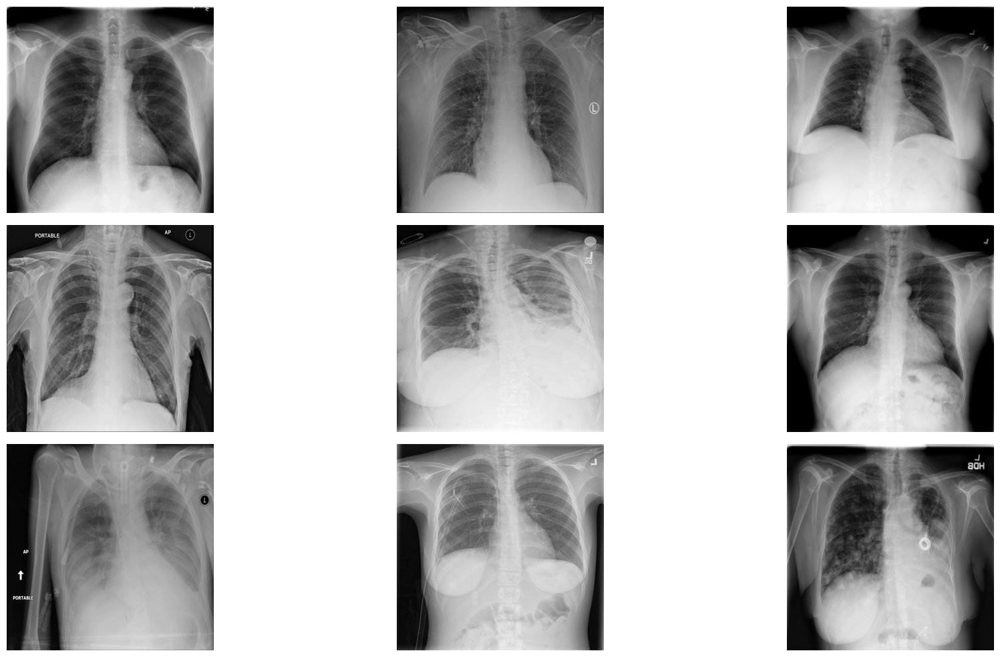

In [37]:
# Extract numpy values from Image column in data frame
images = train_df['Image Index'].values

# Extract 9 random images from it
random_images = [np.random.choice(images) for i in range(9)]

# Location of the image dir
img_dir = 'images/'

print('Display Random Images')

# Adjust the size of your images
plt.figure(figsize=(20,10))

# Iterate and plot random images
for i in range(9):
    plt.subplot(3, 3, i + 1)
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    
# Adjust subplot parameters to give specified padding
plt.tight_layout()    

### Investigate a single image
Look at the first image in the dataset and print out some details of the image contents.

The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 1.0000 and the minimum is 0.0000
The mean value of the pixels is 0.3671 and the standard deviation is 0.1762


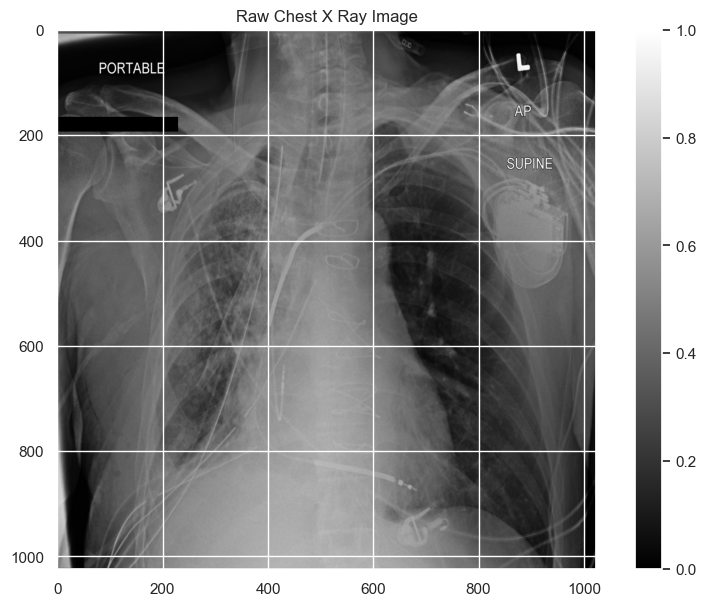

In [38]:
# Get the first image that was listed in the train_df dataframe
sample_img = train_df['Image Index'][0]
raw_image = plt.imread(os.path.join(img_dir, sample_img))
plt.imshow(raw_image, cmap='gray')
plt.grid(color='w', linestyle='-', linewidth=1)
plt.colorbar()
plt.title('Raw Chest X Ray Image')
print(f"The dimensions of the image are {raw_image.shape[0]} pixels width and {raw_image.shape[1]} pixels height, one single color channel")
print(f"The maximum pixel value is {raw_image.max():.4f} and the minimum is {raw_image.min():.4f}")
print(f"The mean value of the pixels is {raw_image.mean():.4f} and the standard deviation is {raw_image.std():.4f}")

### Investigate pixel value distribution
Plot up the distribution of pixel values in the image shown above. 

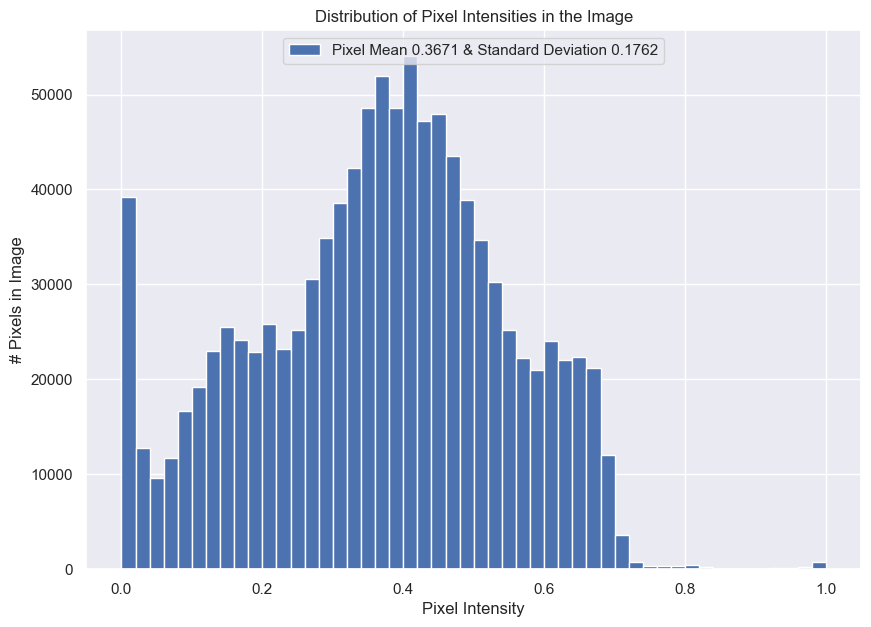

In [39]:
pixels = np.reshape(raw_image,raw_image.shape[0]*raw_image.shape[1])
plt.hist(pixels, bins=50, label=f'Pixel Mean {np.mean(raw_image):.4f} & Standard Deviation {np.std(raw_image):.4f}')
plt.legend(loc='upper center')
plt.title('Distribution of Pixel Intensities in the Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('# Pixels in Image')
plt.show()

# Image Preprocessing in Keras
### Standardization

Normalizing images is better suited for training a convolutional neural network. For this task we use the Keras [ImageDataGenerator](https://keras.io/preprocessing/image/) function to perform data preprocessing and data augmentation.
The `image_generator` will adjust the image data such that the new mean of the data will be zero, and the standard deviation of the data will be 1.  

In other words, the generator will replace each pixel value in the image with a new value calculated by subtracting the mean and dividing by the standard deviation.

$$\frac{x_i - \mu}{\sigma}$$

Create an image generator for preprocessing. Pre-process the data using the `image_generator`as well as reduce the image size down to 320x320 pixels.

In [40]:
# Import data generator from keras https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [41]:
def get_train_generator(df, image_dir, x_col, y_cols, shuffle=True, batch_size=8, seed=1, target_w = 320, target_h = 320):
         
    print("getting train generator...") 
    # Normalize images  --- Generate batches of tensor image data with real-time data augmentation
    image_generator = ImageDataGenerator(
        samplewise_center=True,              #Set each sample mean to 0
        samplewise_std_normalization= True)  # Divide each input by its standard deviation
    
    # default data format of ImageGenerator is channels_last
    generator = image_generator.flow_from_dataframe(
            dataframe=df,
            directory=image_dir,
            x_col=x_col,
            y_col=y_cols,
            class_mode="raw",       #  Mode for yielding the targets, one of "binary", "categorical", "input", "multi_output", "raw", sparse" or None. Default: "categorical".
            batch_size=batch_size,
            shuffle=shuffle,
            seed=seed,
            target_size=(target_w,target_h))
    
    return generator

In [42]:
IMAGE_DIR='images/'

In [43]:
def get_test_and_valid_generator(valid_df, test_df, train_df, image_dir, x_col, y_cols, sample_size=100, batch_size=8, 
                                 seed=1, target_w = 320, target_h = 320):
    """
    Return generator for validation set and test test set using 
    normalization statistics from training set.

    Args:
      valid_df (dataframe): dataframe specifying validation data.
      test_df (dataframe): dataframe specifying test data.
      train_df (dataframe): dataframe specifying training data.
      image_dir (str): directory where image files are held.
      x_col (str): name of column in df that holds filenames.
      y_cols (list): list of strings that hold y labels for images.
      sample_size (int): size of sample to use for normalization statistics.
      batch_size (int): images per batch to be fed into model during training.
      seed (int): random seed.
      target_w (int): final width of input images.
      target_h (int): final height of input images.
    
    Returns:
        test_generator (DataFrameIterator) and valid_generator: iterators over test set and validation set respectively
    """
    # get generator to sample dataset
    print(f"\nextracting {sample_size} train images to normalize validation and test datasets...")

    raw_train_generator = ImageDataGenerator().flow_from_dataframe(
        dataframe=train_df, 
        directory=IMAGE_DIR, 
        x_col="Image Index", 
        y_col=labels, 
        class_mode="raw", 
        batch_size=sample_size, 
        shuffle=True, 
        target_size=(target_w, target_h))
    
    # get data sample
    batch = next(raw_train_generator) # generate a batch of samples and associated labels 
    data_sample = batch[0]             # => we need only the sample imgs ie batch[0]

    # use sample to fit mean and std for test set generator
    image_generator = ImageDataGenerator(
        featurewise_center=True,
        featurewise_std_normalization= True)
    
    # fit generator to sample from training data - we use this generator normalizing mean and std using the train sample of 100
    image_generator.fit(data_sample)
    
    print("\ngetting valid generator...")

    # get test generator
    valid_generator = image_generator.flow_from_dataframe(
            dataframe=valid_df,
            directory=image_dir,
            x_col=x_col,
            y_col=y_cols,
            class_mode="raw",
            batch_size=batch_size,
            shuffle=False,
            seed=seed,
            target_size=(target_w,target_h))
    
    print("\ngetting test generator...")
    test_generator = image_generator.flow_from_dataframe(
            dataframe=test_df,
            directory=image_dir,
            x_col=x_col,
            y_col=y_cols,
            class_mode="raw",
            batch_size=batch_size,
            shuffle=False,
            seed=seed,
            target_size=(target_w,target_h))
    return valid_generator, test_generator

In [44]:
labels = ['Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Atelectasis',
              'Pneumothorax', 'Pleural_Thickening', 'Pneumonia', 'Fibrosis', 'Edema', 'Consolidation']
IMAGE_DIR = "images/"
train_generator = get_train_generator(train_df, IMAGE_DIR, "Image Index", labels)
valid_generator, test_generator= get_test_and_valid_generator(val_df, test_df, train_df, IMAGE_DIR, "Image Index", labels)

getting train generator...
Found 1344 validated image filenames.

extracting 100 train images to normalize validation and test datasets...
Found 1344 validated image filenames.

getting valid generator...
Found 449 validated image filenames.

getting test generator...
Found 769 validated image filenames.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The dimensions of the image are 320 pixels width and 320 pixels height
The maximum pixel value is 2.3409 and the minimum is -2.9753
The mean value of the pixels is 0.0000 and the standard deviation is 1.0000


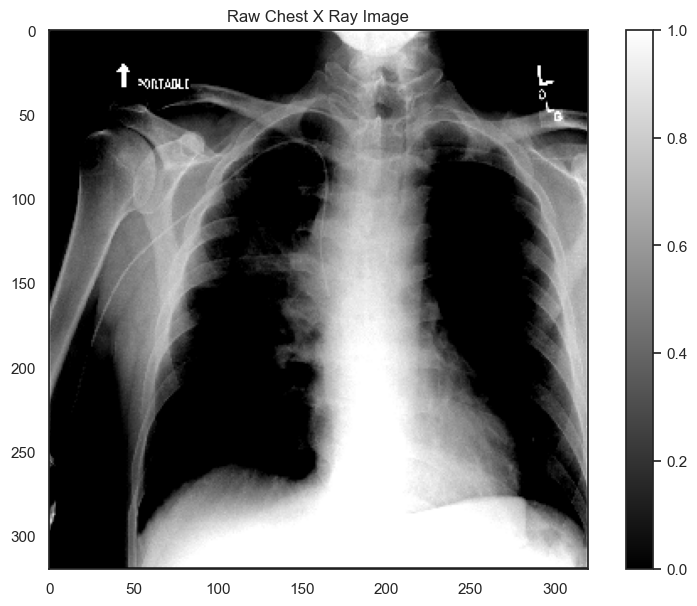

In [45]:
# Plot a processed image
sns.set_style("white")
generated_image, label = train_generator.__getitem__(0)
plt.imshow(generated_image[0], cmap='gray')
plt.colorbar()
plt.title('Raw Chest X Ray Image')
print(f"The dimensions of the image are {generated_image.shape[1]} pixels width and {generated_image.shape[2]} pixels height")
print(f"The maximum pixel value is {generated_image.max():.4f} and the minimum is {generated_image.min():.4f}")
print(f"The mean value of the pixels is {generated_image.mean():.4f} and the standard deviation is {generated_image.std():.4f}")

In [46]:
print(generated_image.shape, generated_image[0].shape)
print(raw_image.shape)

(8, 320, 320, 3) (320, 320, 3)
(1024, 1024)


C:\Users\Palak Bansal\AppData\Local\Temp\ipykernel_11224\974904206.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(raw_image.ravel(),
C:\Users\Palak Bansal\AppData\Local\Temp\ipykernel_11224\974904206.py:13: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(generated_image[0].ravel(),


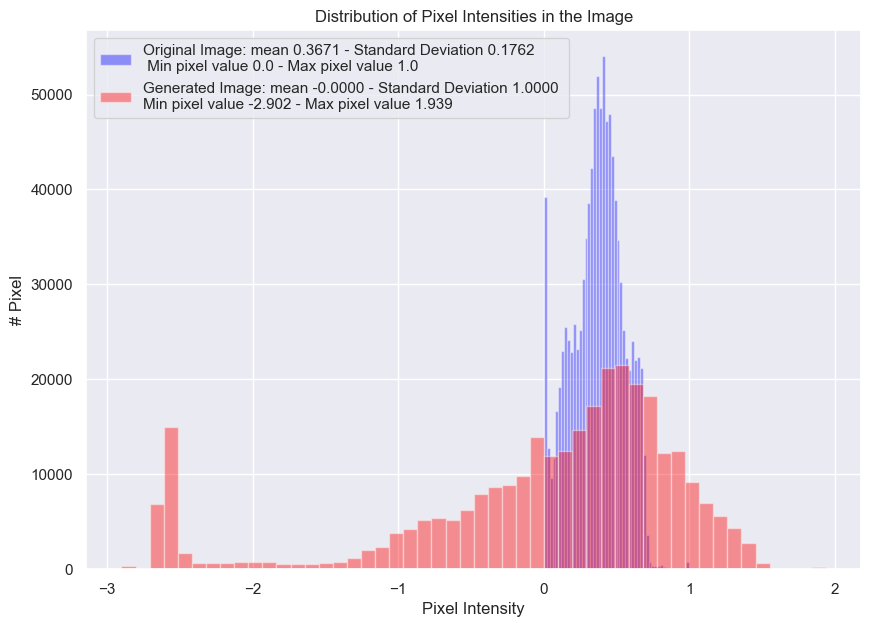

In [47]:
# Include a histogram of the distribution of the pixels
sns.set()
plt.figure(figsize=(10, 7))

# Plot histogram for original iamge
sns.distplot(raw_image.ravel(), 
             label=f'Original Image: mean {np.mean(raw_image):.4f} - Standard Deviation {np.std(raw_image):.4f} \n '
             f'Min pixel value {np.min(raw_image):.4} - Max pixel value {np.max(raw_image):.4}',
             color='blue', 
             kde=False)

# Plot histogram for generated image
sns.distplot(generated_image[0].ravel(), 
             label=f'Generated Image: mean {np.mean(generated_image[0]):.4f} - Standard Deviation {np.std(generated_image[0]):.4f} \n'
             f'Min pixel value {np.min(generated_image[0]):.4} - Max pixel value {np.max(generated_image[0]):.4}', 
             color='red', 
             kde=False)

# Place legends
plt.legend()
plt.title('Distribution of Pixel Intensities in the Image')
plt.xlabel('Pixel Intensity')
plt.ylabel('# Pixel')
plt.show()

### Addressing Class Imbalance - Weighted Loss
One of the challenges with working with medical diagnostic datasets is the large class imbalance present in such datasets. Let's plot the frequency of each of the labels in our dataset:

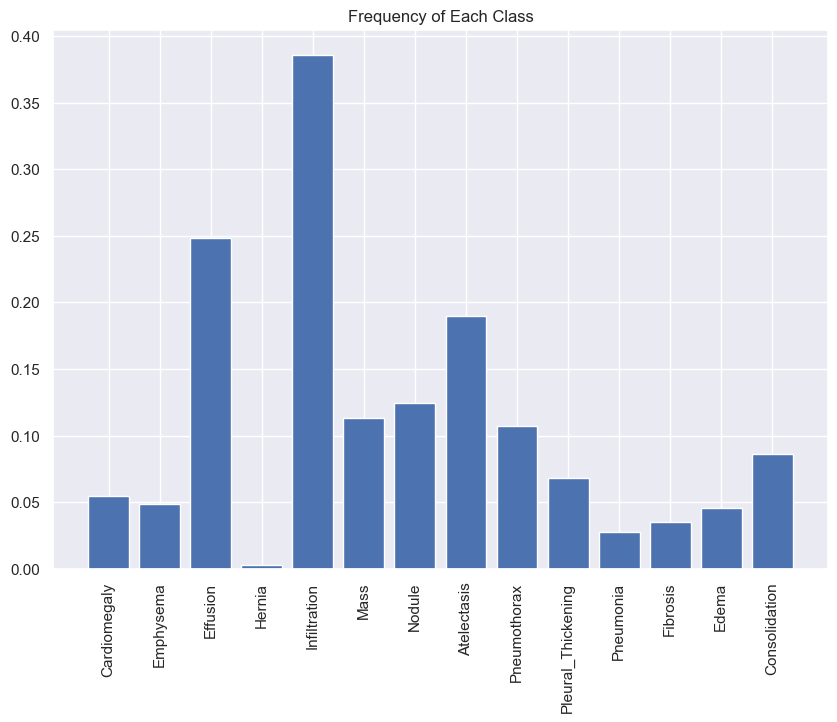

In [48]:
plt.xticks(rotation=90)
plt.bar(x=labels, height=np.mean(train_generator.labels, axis=0))
plt.title("Frequency of Each Class")
plt.show()

In [49]:
def compute_class_freqs(labels):
    """
    Compute positive and negative frequences for each class.

    Args:
        labels (np.array): matrix of labels, size (num_examples, num_classes)
    Returns:
        positive_frequencies (np.array): array of positive frequences for each
                                         class, size (num_classes)
        negative_frequencies (np.array): array of negative frequences for each
                                         class, size (num_classes)
    """
    ### START CODE HERE (REPLACE INSTANCES OF 'None' with your code) ###
    
    # total number of patients (rows)
    N = labels.shape[0]
    
    positive_frequencies = np.sum(labels, axis=0)/N
    negative_frequencies = (N - np.sum(labels, axis=0))/N  # broadcasting of N to a line vector of dim num_classes

    ### END CODE HERE ###
    return positive_frequencies, negative_frequencies

In [50]:
freq_pos, freq_neg = compute_class_freqs(train_generator.labels)
freq_pos

array([0.05431548, 0.0483631 , 0.2485119 , 0.00297619, 0.38541667,
       0.11309524, 0.12425595, 0.18973214, 0.10714286, 0.06845238,
       0.02752976, 0.03497024, 0.0453869 , 0.08630952])

C:\Users\Palak Bansal\AppData\Local\Temp\ipykernel_11224\2978771470.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = data.append([{"Class": labels[l], "Label": "Negative", "Value": v} for l,v in enumerate(freq_neg)], ignore_index=True)


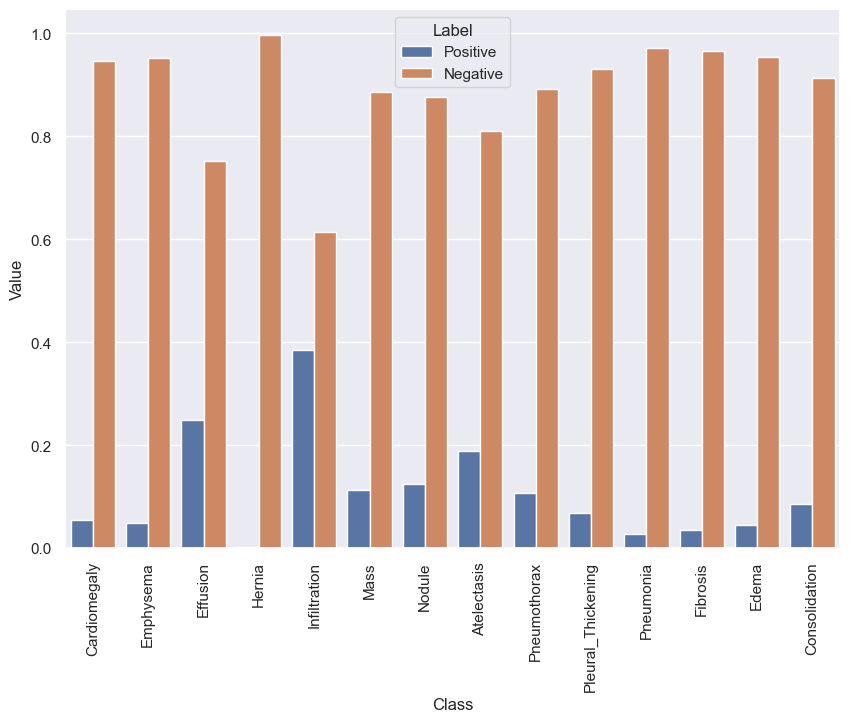

In [51]:
data = pd.DataFrame({"Class": labels, "Label": "Positive", "Value": freq_pos})
data = data.append([{"Class": labels[l], "Label": "Negative", "Value": v} for l,v in enumerate(freq_neg)], ignore_index=True)
plt.xticks(rotation=90)
f = sns.barplot(x="Class", y="Value", hue="Label" ,data=data)

In [52]:
pos_weights = freq_neg
neg_weights = freq_pos
pos_contribution = freq_pos * pos_weights 
neg_contribution = freq_neg * neg_weights

In [53]:
pos_weights,neg_weights

(array([0.94568452, 0.9516369 , 0.7514881 , 0.99702381, 0.61458333,
        0.88690476, 0.87574405, 0.81026786, 0.89285714, 0.93154762,
        0.97247024, 0.96502976, 0.9546131 , 0.91369048]),
 array([0.05431548, 0.0483631 , 0.2485119 , 0.00297619, 0.38541667,
        0.11309524, 0.12425595, 0.18973214, 0.10714286, 0.06845238,
        0.02752976, 0.03497024, 0.0453869 , 0.08630952]))

Let's verify this by graphing the two contributions next to each other :

C:\Users\Palak Bansal\AppData\Local\Temp\ipykernel_11224\4211278599.py:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = data.append([{"Class": labels[l], "Label": "Negative", "Value": v}


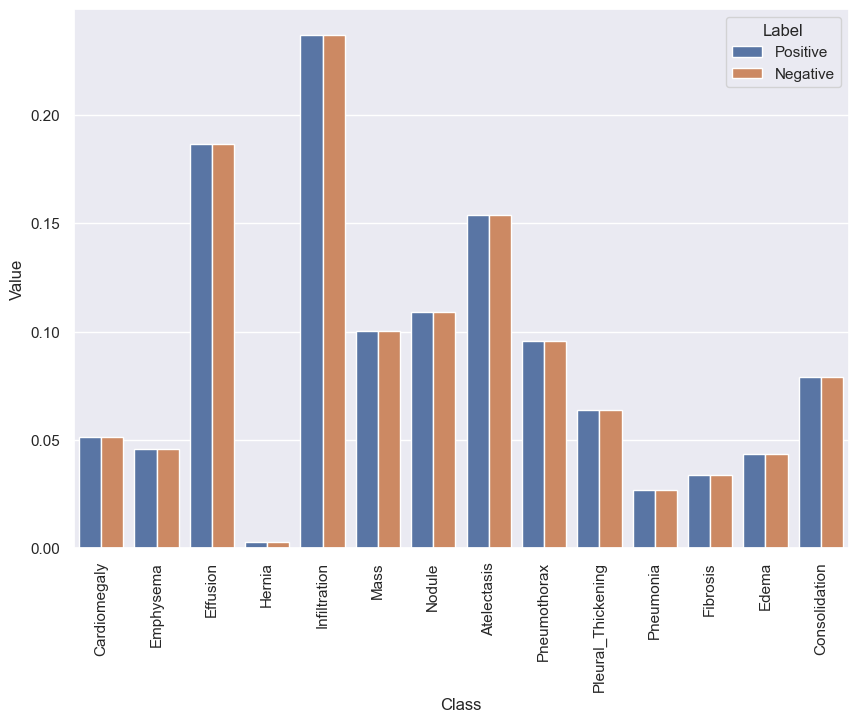

In [54]:
data = pd.DataFrame({"Class": labels, "Label": "Positive", "Value": pos_contribution})
data = data.append([{"Class": labels[l], "Label": "Negative", "Value": v} 
                        for l,v in enumerate(neg_contribution)], ignore_index=True)
plt.xticks(rotation=90)
sns.barplot(x="Class", y="Value", hue="Label" ,data=data);

### Weighted Loss

In [55]:
def get_weighted_loss(pos_weights, neg_weights, epsilon=1e-7):
    """
    Return weighted loss function given negative weights and positive weights.

    Args:
      pos_weights (np.array): array of positive weights for each class, size (num_classes)
      neg_weights (np.array): array of negative weights for each class, size (num_classes)
    
    Returns:
      weighted_loss (function): weighted loss function
    """
    def weighted_loss(y_true, y_pred):
        """
        Return weighted loss value. 

        Args:
            y_true (Tensor): Tensor of true labels, size is (num_examples, num_classes)
            y_pred (Tensor): Tensor of predicted labels, size is (num_examples, num_classes)
        Returns:
            loss (Float): overall scalar loss summed across all classes
        """
        # initialize loss to zero
        loss = 0.0
        
        ### START CODE HERE (REPLACE INSTANCES OF 'None' with your code) ###

        for i in range(len(pos_weights)):
            # for each class, add average weighted loss for that class 
            loss += - pos_weights[i] * K.mean(y_true[:,i] * K.log(y_pred[:,i] + epsilon)) \
            - neg_weights[i] * K.mean((1-y_true[:,i]) * K.log(1-y_pred[:,i] + epsilon)) #complete this line
        return loss
    
        ### END CODE HERE ###
    return weighted_loss             # this is a function taking 2 arguments y_true and y_pred

In [56]:
import keras
from keras.applications.densenet import DenseNet121
from keras.models import Model
from keras.layers import Dense, Activation, Flatten, Dropout, BatchNormalization, GlobalAveragePooling2D
from keras.callbacks import ModelCheckpoint, CSVLogger, LearningRateScheduler, ReduceLROnPlateau, EarlyStopping, TensorBoard
from keras.preprocessing import image

def load_C3M3_model():
   
    class_pos = train_df.loc[:, labels].sum(axis=0)
    class_neg = len(train_df) - class_pos
    class_total = class_pos + class_neg

    pos_weights = class_pos / class_total
    neg_weights = class_neg / class_total
    print("Got loss weights")
    # create the base pre-trained model
    base_model = DenseNet121(weights='densenet.hdf5', include_top=False)
    print("Loaded DenseNet")
    # add a global spatial average pooling layer
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    # and a logistic layer
    predictions = Dense(len(labels), activation="sigmoid")(x)
    print("Added layers")

    model = Model(inputs=base_model.input, outputs=predictions)
    
    model.compile(optimizer='adam',metrics=['accuracy'], loss=get_weighted_loss(neg_weights, pos_weights))
    print("Compiled Model")

    model.load_weights("densenet.hdf5",by_name=True, skip_mismatch=True)
    print("Loaded Weights")
    return model
model = load_C3M3_model()

Got loss weights
Loaded DenseNet
Added layers
Compiled Model
Loaded Weights


In [57]:
model.load_weights

<bound method Model.load_weights of <Functional name=functional_5, built=True>>

let's see the layers that our model is composed of.

In [58]:
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, None,      │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, None,      │      9,408 │ zero_padding2d[0… │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, None,      │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, None,      │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, None,      │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, None,      │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, None,      │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, None,      │          0 │ conv2_block1_0_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, None,      │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, None,      │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, None,      │          0 │ conv2_block1_1_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, None,      │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, None,      │          0 │ pool1[0][0],      │
│ (Concatenate)       │ None, 96)         │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, None,      │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, None,      │          0 │ conv2_block2_0_b… │
│ (Activation)        │ None, 96)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, None,      │     12,288 │ conv2_block2_0_r

 Total params: 7,051,854 (26.90 MB)

 Trainable params: 6,968,206 (26.58 MB)

 Non-trainable params: 83,648 (326.75 KB)

In [59]:
# Print out the total number of layers
layers_ = model.layers
print('total number of layers =',len(layers_))

total number of layers = 429


In [60]:
# The find() method returns an integer value:
# If substring doesn't exist inside the string, it returns -1, otherwise returns first occurence index
conv2D_layers = [layer for layer in model.layers 
                if str(type(layer)).find('Conv2D') > -1]

In [61]:
print('Model input -------------->', model.input)
print('Feature extractor output ->', model.get_layer('conv5_block16_concat').output)
print('Model output ------------->', model.output)

Model input --------------> <KerasTensor shape=(None, None, None, 3), dtype=float32, sparse=None, name=keras_tensor_4610>
Feature extractor output -> <KerasTensor shape=(None, None, None, 1024), dtype=float32, sparse=False, name=keras_tensor_5034>
Model output -------------> <KerasTensor shape=(None, 14), dtype=float32, sparse=False, name=keras_tensor_5038>


## Training

In [62]:
history = model.fit(train_generator, 
                              validation_data=valid_generator,
                              steps_per_epoch=1, 
                              validation_steps=25, 
                              epochs =50)

plt.plot(history.history['loss'])
plt.ylabel("loss")
plt.xlabel("epoch")
plt.title("Training Loss Curve")
plt.show()

Epoch 1/50


C:\Users\Palak Bansal\AppData\Roaming\Python\Python312\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 80s 80s/step - accuracy: 0.1250 - loss: 1.9322 - val_accuracy: 0.0800 - val_loss: 2.0021
Epoch 2/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step - accuracy: 0.1250 - loss: 1.4436 - val_accuracy: 0.2450 - val_loss: 2.0050
Epoch 3/50


KeyboardInterrupt: 

## Prediction and Evaluation
Now that we have a model, let's evaluate it using our test set. We can conveniently use the predict_generator function to generate the predictions for the images in our test set.

In [63]:
predicted_vals = model.predict(test_generator, steps = len(test_generator))
predicted_vals.shape  # number of test samples x number of classes to predict

97/97 ━━━━━━━━━━━━━━━━━━━━ 66s 637ms/step


(769, 14)

### ROC Curve and AUROC
Compute metric called the AUC (Area Under the Curve) from the ROC ([Receiver Operating Characteristic](https://en.wikipedia.org/wiki/Receiver_operating_characteristic)) curve. ideally we want a curve that is more to the left so that the top has more "area" under it, which indicates that the model is performing better.

In [64]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

def get_roc_curve(labels, predicted_vals, generator):
    auc_roc_vals = []
    for i in range(len(labels)):
        try:
            gt = generator.labels[:, i]
            pred = predicted_vals[:, i]
            auc_roc = roc_auc_score(gt, pred)
            auc_roc_vals.append(auc_roc)
            fpr_rf, tpr_rf, _ = roc_curve(gt, pred)
            plt.figure(1, figsize=(10, 10))
            plt.plot([0, 1], [0, 1], 'k--')
            plt.plot(fpr_rf, tpr_rf,
                     label=labels[i] + " (" + str(round(auc_roc, 3)) + ")")
            plt.xlabel('False positive rate')
            plt.ylabel('True positive rate')
            plt.title('ROC curve')
            plt.legend(loc='best')
        except:
            print(
                f"Error in generating ROC curve for {labels[i]}. "
                f"Dataset lacks enough examples."
            )
    plt.savefig('ROC.png')
    plt.show()
    return auc_roc_vals

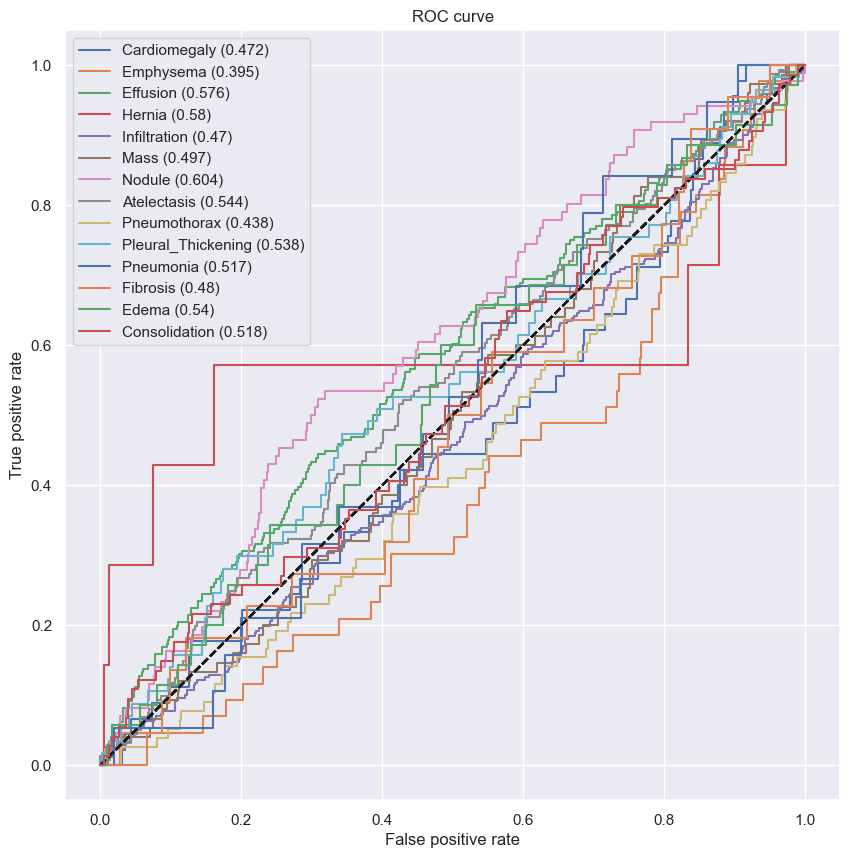

In [65]:
auc_rocs = get_roc_curve(labels, predicted_vals, test_generator)

In [66]:
print("areas under the curve : {} \n for all {} classes".format(auc_rocs,len(auc_rocs)))

areas under the curve : [0.4716083486801719, 0.39506054199500285, 0.5759251344516865, 0.5802399700037495, 0.47022777456690235, 0.4968107588856868, 0.6042085191868978, 0.5435497711670481, 0.4377713458755427, 0.5376010250344964, 0.5174736842105263, 0.4797979797979798, 0.5395095367847411, 0.5175967334240716] 
 for all 14 classes


## Interpreting Deep Learning Models

Let's load in an X-ray image.

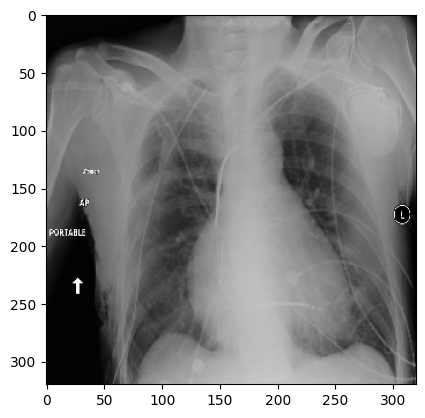

In [67]:
sns.reset_defaults()

def get_mean_std_per_batch(df, H=320, W=320):
    sample_data = []
    for idx, img in enumerate(df.sample(100)["Image Index"].values):
        path = IMAGE_DIR + img
        sample_data.append(np.array(image.load_img(path, target_size=(H, W))))

    mean = np.mean(sample_data[0])
    std = np.std(sample_data[0])
    return mean, std    

def load_image_normalize(path, mean, std, H=320, W=320):
    x = image.load_img(path, target_size=(H, W))
    x -= mean
    x /= std
    x = np.expand_dims(x, axis=0)
    return x

def load_image(path, df, preprocess=True, H = 320, W = 320):
    """Load and preprocess image."""
    x = image.load_img(path, target_size=(H, W))
    if preprocess:
        mean, std = get_mean_std_per_batch(df, H=H, W=W)
        x -= mean
        x /= std
        x = np.expand_dims(x, axis=0)
    return x

im_path = IMAGE_DIR + '00000013_026.png' 
x = load_image(im_path, train_df, preprocess=False)
plt.imshow(x, cmap = 'gray')
plt.show()

Next, let's get our predictions. Before we plug the image into our model, we have to normalize it. Run the next cell to compute the mean and standard deviation of the images in our training set. 

In [68]:
mean,std

(116.907412109375, 59.33966556953607)

In [69]:
mean, std = get_mean_std_per_batch(train_df)

Now we are ready to normalize and run the image through our model to get predictions.

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


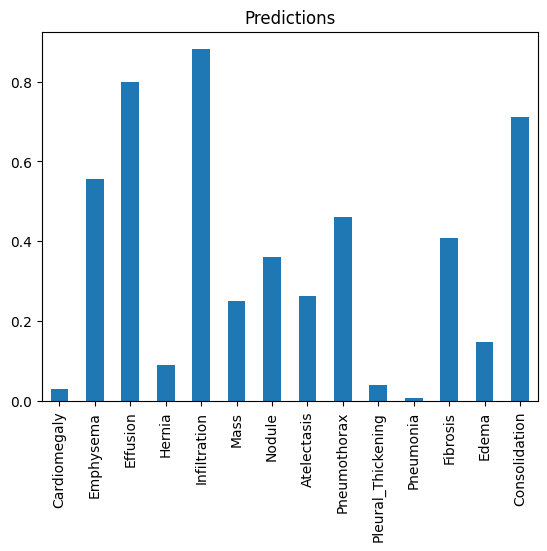

In [70]:
labels = ['Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Atelectasis',
              'Pneumothorax', 'Pleural_Thickening', 'Pneumonia', 'Fibrosis', 'Edema', 'Consolidation']

processed_image = load_image_normalize(im_path, mean, std)
preds = model.predict(processed_image)
pred_df = pd.DataFrame(preds, columns = labels)
pred_df.loc[0, :].plot.bar()
plt.title("Predictions")
plt.savefig('predictions.png')
plt.show()

In [71]:
pred_df

,Cardiomegaly,Emphysema,Effusion,Hernia,Infiltration,Mass,Nodule,Atelectasis,Pneumothorax,Pleural_Thickening,Pneumonia,Fibrosis,Edema,Consolidation
0,0.031152,0.555247,0.799137,0.091789,0.880318,0.250055,0.360031,0.264633,0.462314,0.040455,0.007494,0.408736,0.149236,0.711319


We see, for example, that the model predicts Mass (abnormal spot or area in the lungs that are more than 3 centimeters) with high probability. Indeed, this patient was diagnosed with mass. However, we don't know where the model is looking when it's making its own diagnosis. To gain more insight into what the model is looking at, we can use GradCAMs.

# GradCAM

GradCAM is a technique to visualize the impact of each region of an image on a specific output for a Convolutional Neural Network model. Through GradCAM, we can generate a heatmap by computing gradients of the specific class scores we are interested in visualizing.

#### Getting Intermediate Layers

Perhaps the most complicated part of computing GradCAM is accessing intermediate activations in our deep learning model and computing gradients with respect to the class output. Typically we'll only be extracting one of the last few. The last few layers usually have more abstract information. To access a layer, we can use `model.get_layer(layer).output`, which takes in the name of the layer in question. Here we are going to extract the raw output of the last convolutional layer `conv5_block16_concat`.

In [72]:
spatial_maps =  model.get_layer('conv5_block16_concat').output
print(spatial_maps)

<KerasTensor shape=(None, None, None, 1024), dtype=float32, sparse=False, name=keras_tensor_5034>


Now, this tensor is just a placeholder, it doesn't contain the actual activations for a particular image. To get this we will use [Keras.backend.function](https://www.tensorflow.org/api_docs/python/tf/keras/backend/function) to return intermediate computations while the model is processing a particular input. This method takes in an input and output placeholders and returns a function. This function will compute the intermediate output (until it reaches the given placeholder) evaluated given the input. For example, if you want the layer that you just retrieved (conv5_block16_concat), you could write the following:

In [73]:
get_spatial_maps = Model([model.input], [spatial_maps])
print(get_spatial_maps)

<Functional name=functional_6, built=True>


We see that we now have a `Function` object. Now, to get the actual intermediate output evaluated with a particular input, we just plug in an image to this function:

In [74]:
# get an image
x = load_image_normalize(im_path, mean, std)
print(f"x is of type {type(x)}")
print(f"x is of shape {x.shape}")

x is of type <class 'numpy.ndarray'>
x is of shape (1, 320, 320, 3)


In [75]:
# get the 0th item in the list
spatial_maps_x = get_spatial_maps([x])[0]
print(f"spatial_maps_x is of type {type(spatial_maps_x)}")
print(f"spatial_maps_x is of shape {spatial_maps_x.shape}")
print(f"spatial_maps_x without the batch dimension has shape {spatial_maps_x[0].shape}")

spatial_maps_x is of type <class 'tensorflow.python.framework.ops.EagerTensor'>
spatial_maps_x is of shape (10, 10, 1024)
spatial_maps_x without the batch dimension has shape (10, 1024)


We now have the activations for that particular image, and we can use it for interpretation. The function that is returned by calling `K.function([model.input], [spatial_maps])` (saved here in the variable `get_spatial_maps`) is sometimes referred to as a "hook", letting you peek into the intermediate computations in the model. 

#### Getting Gradients

The other major step in computing GradCAMs is getting gradients with respect to the output for a particular class.

In [76]:
# get the output of the model
output_with_batch_dim = model.output
print(f"Model output includes batch dimension, has shape {output_with_batch_dim.shape}")
print(f"excluding the batch dimension, the output for all 14 categories of disease has shape {output_with_batch_dim[0].shape}")

Model output includes batch dimension, has shape (None, 14)
excluding the batch dimension, the output for all 14 categories of disease has shape (14,)


The output has 14 categories, one for each disease category, indexed from 0 to 13. Cardiomegaly is the disease category at index 0.

In [77]:
# Get the first category's output (Cardiomegaly) at index 0
y_category_0 = output_with_batch_dim[0][0]
print(f"The Cardiomegaly output is at index 0, and has shape {y_category_0.shape}")

The Cardiomegaly output is at index 0, and has shape ()


In [78]:
import tensorflow as tf

In [79]:
# Get gradient of y_category_0 with respect to spatial_maps
# The first parameter is the value you are taking the gradient of, and the second is the parameter you are taking that gradient with respect to.
gradient_l = tf.GradientTape(y_category_0, spatial_maps)
print(f"gradient_l is of type {type(gradient_l)} ")

# gradient_l is a list of size 1.  Get the gradient at index 0
print(gradient_l)

gradient_l is of type <class 'tensorflow.python.eager.backprop.GradientTape'> 


In [80]:
# get an input x-ray image
x = load_image_normalize(im_path, mean, std)
print(f"X-ray image has shape {x.shape}")

X-ray image has shape (1, 320, 320, 3)


The `get_gradient` function takes in a list of inputs, and returns a list of the gradients, one for each image.

### Implementing GradCAM

In [81]:
def grad_cam(input_model, image, category_index, layer_name):
    """
    GradCAM method for visualizing input saliency.
    
    Args:
        input_model (Keras.model): model to compute cam for
        image (tensor): input to model, shape (1, H, W, 3)
        cls (int): class to compute cam with respect to
        layer_name (str): relevant layer in model
        H (int): input height
        W (int): input width
    Return:
        cam ()
    """
    cam = None
    
    ### START CODE HERE (REPLACE INSTANCES OF 'None' with your code) ###

    # 1. Get placeholders for class output and last layer
    # Get the model's output
    output_with_batch_dim = input_model.output
    
    # Remove the batch dimension
    output_all_categories = output_with_batch_dim[0]
    
    # Retrieve only the disease category at the given category index
    y_c = output_all_categories[category_index]
    
    # Get the input model's layer specified by layer_name, and retrive the layer's output tensor
    spatial_map_layer = input_model.get_layer(layer_name).output

    # 2. Get gradients of last layer with respect to output

    # get the gradients of y_c with respect to the spatial map layer (it's a list of length 1)
    grads_l = tf.GradientTape(y_c, spatial_map_layer)
    
    # Get the gradient at index 0 of the list
    grads = grads_l[0]
        
    # 3. Get hook for the selected layer and its gradient, based on given model's input
    # Hint: Use the variables produced by the previous two lines of code
    spatial_map_and_gradient_function = K.function([input_model.input], [spatial_map_layer, grads])
    
    # Put in the image to calculate the values of the spatial_maps (selected layer) and values of the gradients
    spatial_map_all_dims, grads_val_all_dims = spatial_map_and_gradient_function([image])

    # Reshape activations and gradient to remove the batch dimension
    # Shape goes from (B, H, W, C) to (H, W, C)
    # B: Batch. H: Height. W: Width. C: Channel    
    # Reshape spatial map output to remove the batch dimension
    spatial_map_val = spatial_map_all_dims[0]
    
    # Reshape gradients to remove the batch dimension
    grads_val = grads_val_all_dims[0]
    
    # 4. Compute weights using global average pooling on gradient 
    # grads_val has shape (Height, Width, Channels) (H,W,C)
    # Take the mean across the height and also width, for each channel
    # Make sure weights have shape (C)
    weights = np.mean(grads_val, axis=(0,1))
    
    # 5. Compute dot product of spatial map values with the weights
    cam = np.dot(spatial_map_val, weights)    # shape (10,10,1024) x shape(1024,) resulting into shape(10,10)

    ### END CODE HERE ###
    
    # We'll take care of the postprocessing.
    H, W = image.shape[1], image.shape[2]
    cam = np.maximum(cam, 0) # ReLU so we only get positive importance
    cam = cv2.resize(cam, (W, H), cv2.INTER_NEAREST)
    cam = cam / cam.max()

    return cam

- Generate the CAM for the image

In [82]:
def grad_cam(input_model, image, category_index, layer_name):
    import tensorflow as tf
    import numpy as np
    import cv2
    
    # Convert the image to a tensor
    image_tensor = tf.convert_to_tensor(image, dtype=tf.float32)
    
    # Create a model that maps the input image to the activations of the layer of interest and the output predictions
    grad_model = tf.keras.models.Model(
        inputs=[input_model.inputs],
        outputs=[input_model.get_layer(layer_name).output, input_model.output]
    )
    
    with tf.GradientTape() as tape:
        # Forward pass
        conv_outputs, predictions = grad_model(image_tensor)
        loss = predictions[:, category_index]
    
    # Compute the gradient of the loss with respect to the output feature map of the convolutional layer
    grads = tape.gradient(loss, conv_outputs)
    
    # Compute the guided gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    # Multiply each channel in the feature map array by "how important this channel is" with regard to the top predicted class
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)
    
    # Apply ReLU to the heatmap to retain only positive values
    heatmap = np.maximum(heatmap, 0)
    
    # Normalize the heatmap
    if np.max(heatmap) != 0:
        heatmap /= np.max(heatmap)
    else:
        heatmap = np.zeros_like(heatmap)
    
    # Resize the heatmap to the size of the original image
    heatmap = cv2.resize(heatmap, (image.shape[2], image.shape[1]))
    
    return heatmap



- Visualize the CAM and the original image. 

In [83]:
im_path='00025288_001.png'

In [84]:
im = load_image_normalize(im_path, mean, std)

# Generate the CAM
cam = grad_cam(model, im, 6, 'conv5_block16_concat')

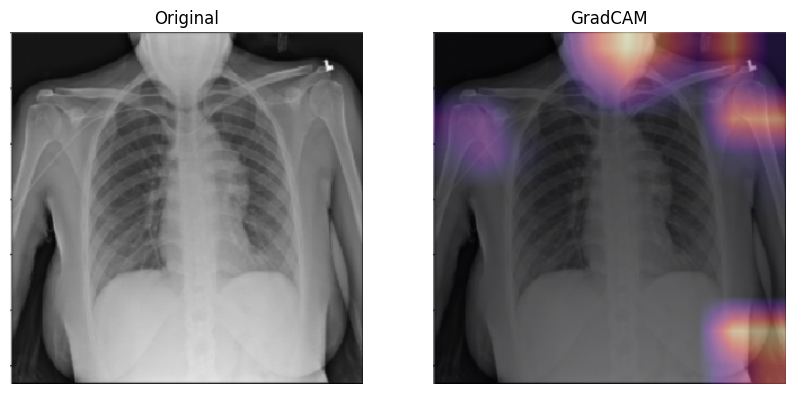

In [85]:
plt.rcParams['figure.figsize'] = [10, 7]
plt.subplot(121)
plt.imshow(load_image(im_path, train_df, preprocess=False), cmap='gray')
plt.title("Original")
plt.axis('off')

plt.subplot(122)
plt.imshow(load_image(im_path, train_df, preprocess=False), cmap='gray')
plt.imshow(cam, cmap='magma', alpha=0.5)
plt.title("GradCAM")
plt.axis('off')
plt.show()

We can see that it focuses on the large (white) empty area on the right lung. Indeed this is a clear case of Mass.


### Using GradCAM to Visualize Multiple Labels

We can use GradCAMs for multiple labels on the same image. Let's do it for the labels with best AUC for our model, Cardiomegaly, Mass, and Edema. 

In [86]:
import math

def compute_gradcam(model, img, mean, std, data_dir, df, 
                    labels, selected_labels, layer_name='conv5_block16_concat'):
  
    img_path = data_dir + img
    preprocessed_input = load_image_normalize(img_path, mean, std)
    predictions = model.predict(preprocessed_input)
    
    # Print ground truth
    print("Ground Truth: ", ", ".join(np.take(labels, np.nonzero(df[df["Image Index"] == img][labels].values[0]))[0]))
    
    # Calculate grid size
    num_labels = len(selected_labels)
    grid_size = int(math.ceil(math.sqrt(num_labels)))
    
    # Create a grid of subplots
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    
    # Plot the original image in the first subplot
    axes[0, 0].imshow(load_image(img_path, df, preprocess=False), cmap='gray')
    axes[0, 0].set_title("Original")
    axes[0, 0].axis('off')
    
    # Initialize index for subplot
    index = 1
    
    # Loop through all labels and compute GradCAM
    for i in range(len(labels)):
        if labels[i] in selected_labels:
            # Compute GradCAM
            gradcam = grad_cam(model, preprocessed_input, i, layer_name)
            
            print("Generating GradCAM for class %s (p=%2.2f)" % (labels[i], round(predictions[0][i], 3)))
            
            # Determine subplot index
            row = index // grid_size
            col = index % grid_size
            
            # Plot GradCAM
            axes[row, col].imshow(load_image(img_path, df, preprocess=False), cmap='gray')
            axes[row, col].imshow(gradcam, cmap='magma', alpha=min(0.5, predictions[0][i]))
            axes[row, col].set_title(labels[i] + ": " + str(round(predictions[0][i], 3)))
            axes[row, col].axis('off')
            
            index += 1
    
    # Hide any unused subplots
    for i in range(index, grid_size * grid_size):
        row = i // grid_size
        col = i % grid_size
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()



Run the following cells to print the ground truth diagnosis for a given case and show the original x-ray as well as GradCAMs for Cardiomegaly, Mass, and Edema.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
Ground Truth:  Mass, Consolidation
Generating GradCAM for class Cardiomegaly (p=0.08)
Generating GradCAM for class Emphysema (p=0.84)
Generating GradCAM for class Effusion (p=0.49)
Generating GradCAM for class Hernia (p=0.10)
Generating GradCAM for class Infiltration (p=0.93)
Generating GradCAM for class Mass (p=0.17)
Generating GradCAM for class Nodule (p=0.52)
Generating GradCAM for class Atelectasis (p=0.33)
Generating GradCAM for class Pneumothorax (p=0.74)
Generating GradCAM for class Pleural_Thickening (p=0.15)
Generating GradCAM for class Pneumonia (p=0.01)
Generating GradCAM for class Fibrosis (p=0.35)
Generating GradCAM for class Edema (p=0.17)
Generating GradCAM for class Consolidation (p=0.86)


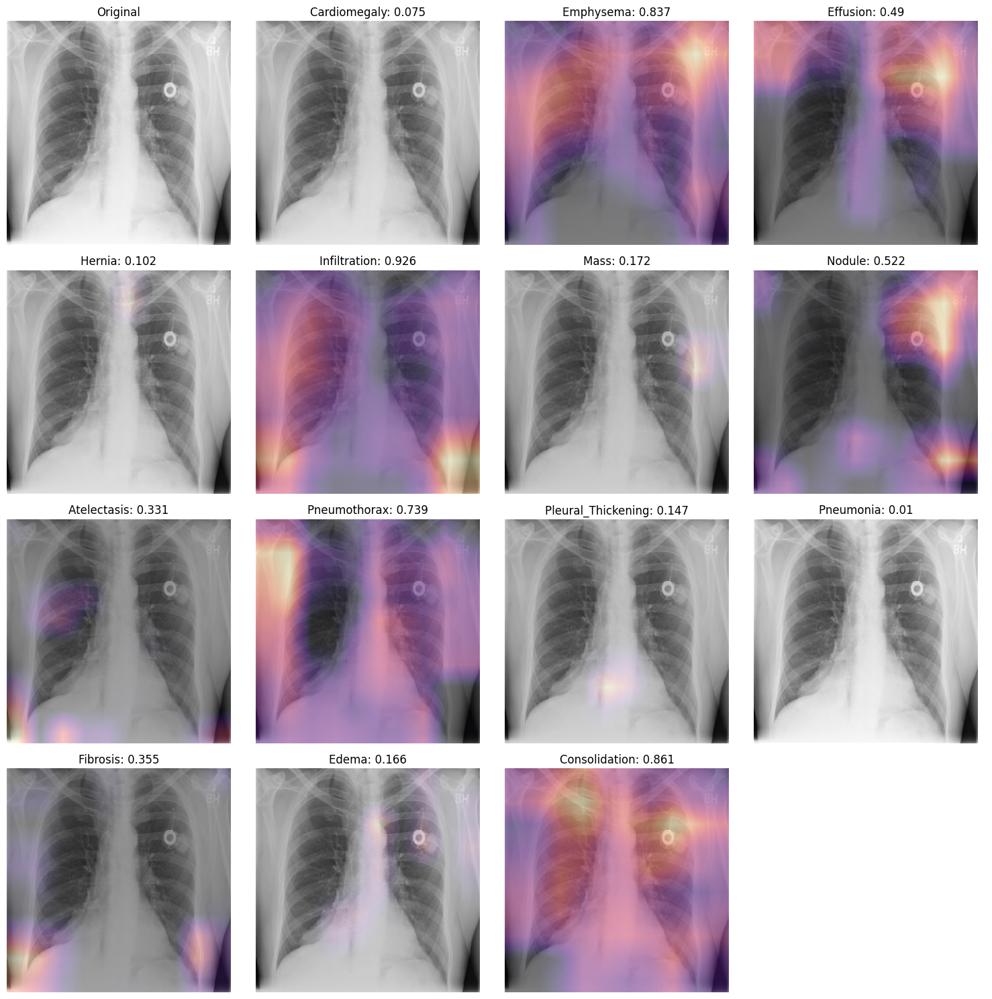

In [87]:
image_filename = '00000040_003.png'
labels_to_show =  ['Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Nodule', 'Pneumothorax', 'Atelectasis', 'Pleural_Thickening', 'Mass', 'Edema', 'Consolidation', 'Infiltration', 'Fibrosis', 'Pneumonia']
compute_gradcam(model, image_filename, mean, std, IMAGE_DIR, train_df, labels, labels_to_show)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
Ground Truth:  Effusion
Generating GradCAM for class Cardiomegaly (p=0.06)
Generating GradCAM for class Emphysema (p=0.71)
Generating GradCAM for class Effusion (p=0.57)
Generating GradCAM for class Hernia (p=0.06)
Generating GradCAM for class Infiltration (p=0.86)
Generating GradCAM for class Mass (p=0.10)
Generating GradCAM for class Nodule (p=0.62)
Generating GradCAM for class Atelectasis (p=0.35)
Generating GradCAM for class Pneumothorax (p=0.45)
Generating GradCAM for class Pleural_Thickening (p=0.07)
Generating GradCAM for class Pneumonia (p=0.00)
Generating GradCAM for class Fibrosis (p=0.40)
Generating GradCAM for class Edema (p=0.18)
Generating GradCAM for class Consolidation (p=0.41)


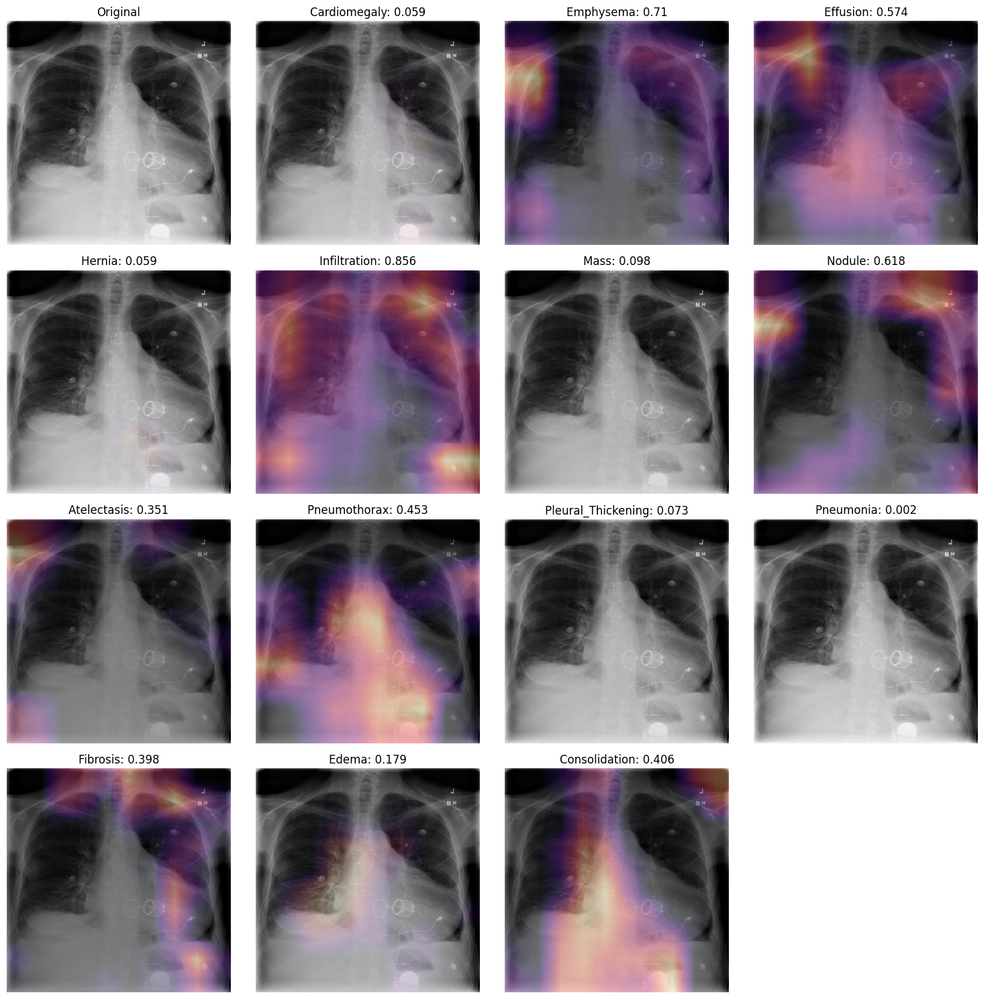

In [88]:
image_filename = '00000096_006.png'
compute_gradcam(model, image_filename, mean, std, IMAGE_DIR, train_df, labels, labels_to_show)

In the example above, the model correctly focuses on the mass near the center of the chest cavity. 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
Ground Truth:  Edema
Generating GradCAM for class Cardiomegaly (p=0.04)
Generating GradCAM for class Emphysema (p=0.61)
Generating GradCAM for class Effusion (p=0.50)
Generating GradCAM for class Hernia (p=0.09)
Generating GradCAM for class Infiltration (p=0.96)
Generating GradCAM for class Mass (p=0.17)
Generating GradCAM for class Nodule (p=0.52)
Generating GradCAM for class Atelectasis (p=0.45)
Generating GradCAM for class Pneumothorax (p=0.57)
Generating GradCAM for class Pleural_Thickening (p=0.06)
Generating GradCAM for class Pneumonia (p=0.00)
Generating GradCAM for class Fibrosis (p=0.48)
Generating GradCAM for class Edema (p=0.20)
Generating GradCAM for class Consolidation (p=0.74)


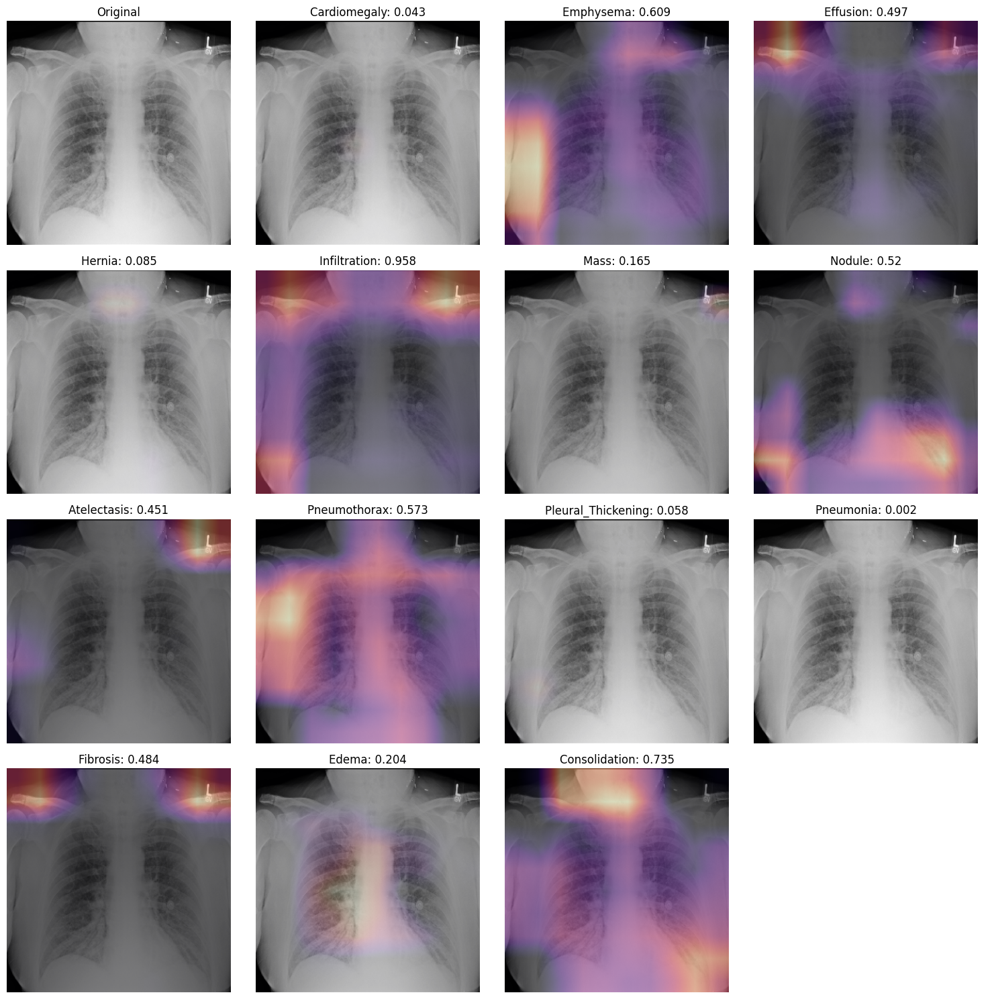

In [89]:
image_name = '00004090_002.png'
compute_gradcam(model, image_name, mean, std, IMAGE_DIR, train_df, labels, labels_to_show)

Here the model correctly picks up the signs of edema near the bottom of the chest cavity. We can also notice that Cardiomegaly has a high score for this image, though the ground truth doesn't include it.
This visualization might be helpful for error analysis; for example, we can notice that the model is indeed looking at the expected area to make the prediction.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
Ground Truth:  Atelectasis
Generating GradCAM for class Cardiomegaly (p=0.03)
Generating GradCAM for class Emphysema (p=0.55)
Generating GradCAM for class Effusion (p=0.53)
Generating GradCAM for class Hernia (p=0.05)
Generating GradCAM for class Infiltration (p=0.84)
Generating GradCAM for class Mass (p=0.16)
Generating GradCAM for class Nodule (p=0.36)
Generating GradCAM for class Atelectasis (p=0.32)
Generating GradCAM for class Pneumothorax (p=0.54)
Generating GradCAM for class Pleural_Thickening (p=0.09)
Generating GradCAM for class Pneumonia (p=0.01)
Generating GradCAM for class Fibrosis (p=0.19)
Generating GradCAM for class Edema (p=0.14)
Generating GradCAM for class Consolidation (p=0.69)


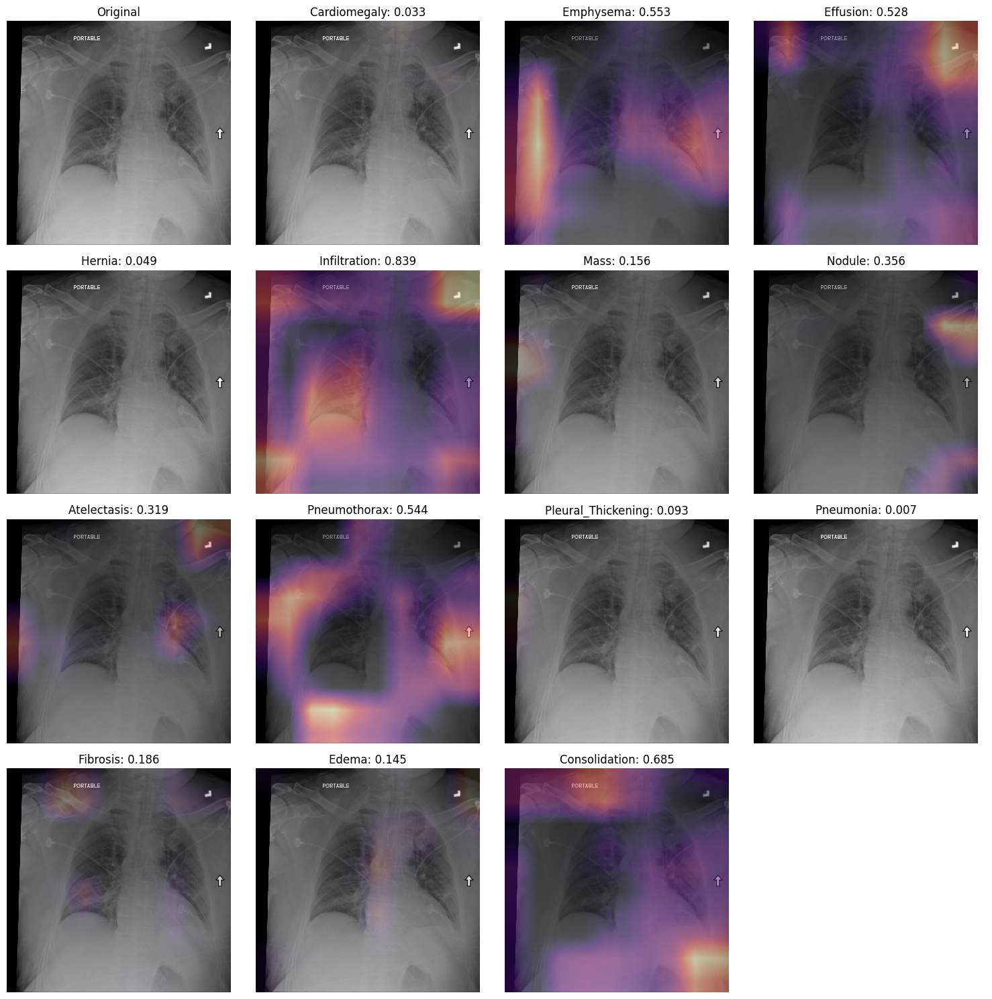

In [90]:
image_name = '00000175_001.png'
compute_gradcam(model, image_name, mean, std, IMAGE_DIR, train_df, labels, labels_to_show)

Here the model picks up signs of the mass near the center of the chest cavity on the right. Edema has a high score for this image, though the ground truth doesn't include it.

## Interpretation tools like this one can be helpful for discovery of markers, error analysis, and even in deployment. 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
Ground Truth:  Atelectasis
Generating GradCAM for class Cardiomegaly (p=0.03)
Generating GradCAM for class Emphysema (p=0.55)
Generating GradCAM for class Effusion (p=0.53)
Generating GradCAM for class Hernia (p=0.05)
Generating GradCAM for class Infiltration (p=0.84)
Generating GradCAM for class Mass (p=0.16)
Generating GradCAM for class Nodule (p=0.36)
Generating GradCAM for class Atelectasis (p=0.32)
Generating GradCAM for class Pneumothorax (p=0.54)
Generating GradCAM for class Pleural_Thickening (p=0.09)
Generating GradCAM for class Pneumonia (p=0.01)
Generating GradCAM for class Fibrosis (p=0.19)
Generating GradCAM for class Edema (p=0.14)
Generating GradCAM for class Consolidation (p=0.69)


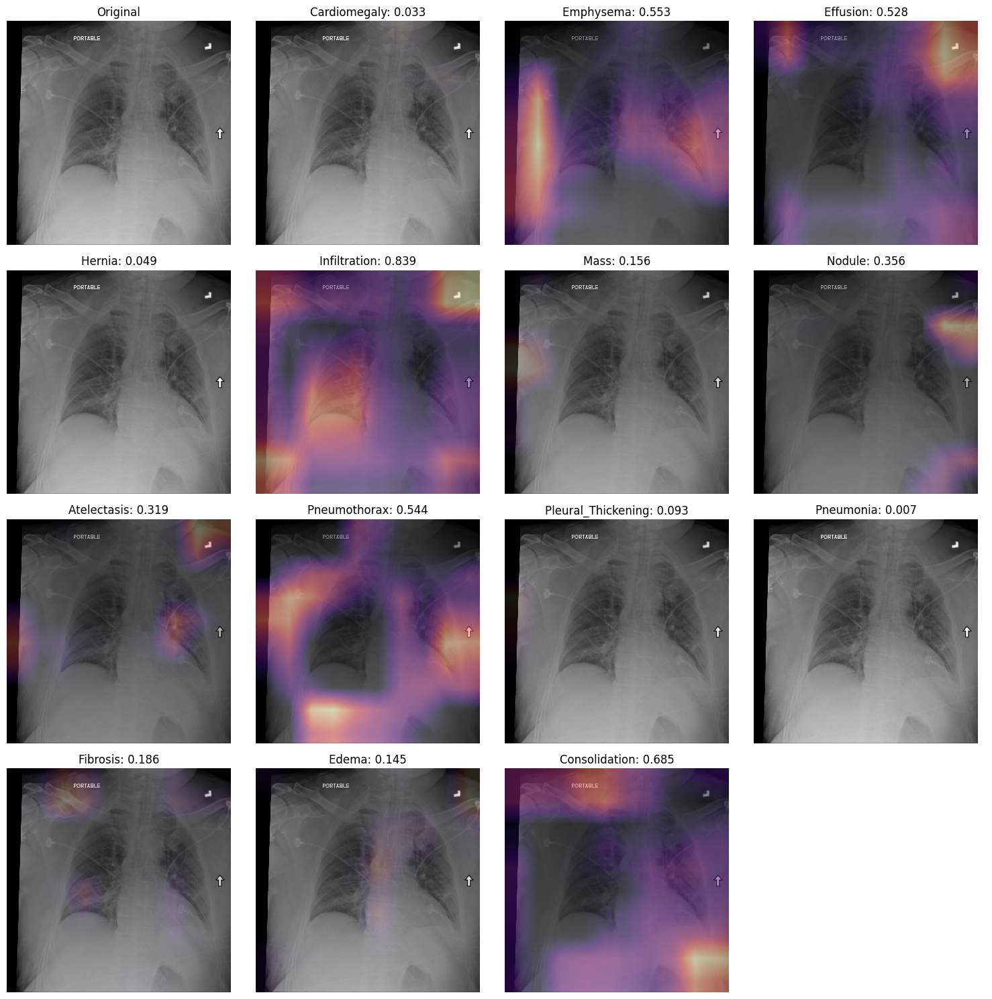

In [91]:
image_name = '00000175_001.png'
compute_gradcam(model, image_name, mean, std, IMAGE_DIR, train_df, labels, labels_to_show)

Index(['Unnamed: 0', 'Image Index', 'Patient ID', 'Cardiomegaly', 'Emphysema',
       'Effusion', 'Hernia', 'Nodule', 'Pneumothorax', 'Atelectasis',
       'Pleural_Thickening', 'Mass', 'Edema', 'Consolidation', 'Infiltration',
       'Fibrosis', 'Pneumonia'],
      dtype='object')


C:\Users\Palak Bansal\AppData\Roaming\Python\Python312\site-packages\keras\src\saving\saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 370 variables whereas the saved optimizer has 738 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Index(['Unnamed: 0', 'Image Index', 'Patient ID', 'Cardiomegaly', 'Emphysema',
       'Effusion', 'Hernia', 'Nodule', 'Pneumothorax', 'Atelectasis',
       'Pleural_Thickening', 'Mass', 'Edema', 'Consolidation', 'Infiltration',
       'Fibrosis', 'Pneumonia'],
      dtype='object')
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Ground Truth:  Mass, Pneumothorax
Generating GradCAM for class Cardiomegaly (p=0.00)
Generating GradCAM for class Emphysema (p=0.00)
Generating GradCAM for class Effusion (p=0.98)
Generating GradCAM for class Hernia (p=0.00)
Generating GradCAM for class Infiltration (p=0.00)
Generating GradCAM for class Mass (p=0.00)
Generating GradCAM for class Nodule (p=0.00)
Generating GradCAM for class Atelectasis (p=0.00)
Generating GradCAM for class Pneumothorax (p=0.00)
Generating GradCAM for class Pleural_Thickening (p=0.00)
Generating GradCAM for class Pneumonia (p=0.00)
Generating GradCAM for class Fibrosis (p=0.62)
Generating GradCAM for class Edema (p=1.00)
Generating GradCAM f

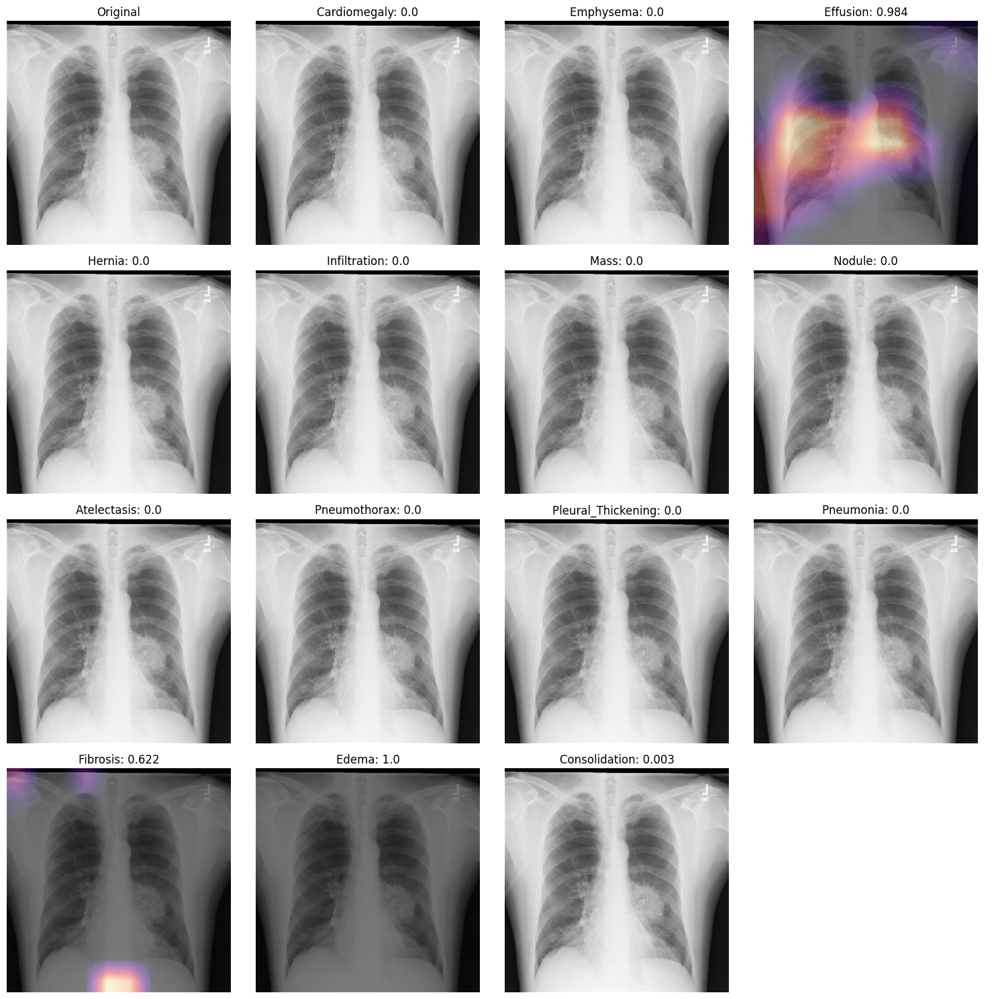

In [98]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from keras.models import load_model
from keras.preprocessing import image
import tensorflow as tf
from tensorflow.keras import backend as K
import cv2
import os
import math

# Load the DataFrame
df = pd.read_csv('dataset.csv')
print(df.columns)
# Define the labels and normalization parameters
labels = ['Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Atelectasis',
          'Pneumothorax', 'Pleural_Thickening', 'Pneumonia', 'Fibrosis', 'Edema', 'Consolidation']
mean, std = 116.907412109375, 59.33966556953607

# Define the weighted loss function
def get_weighted_loss(pos_weights, neg_weights, epsilon=1e-7):
    def weighted_loss(y_true, y_pred):
        loss = 0.0
        for i in range(len(pos_weights)):
            loss += - pos_weights[i] * K.mean(y_true[:, i] * K.log(y_pred[:, i] + epsilon)) \
                   - neg_weights[i] * K.mean((1 - y_true[:, i]) * K.log(1 - y_pred[:, i] + epsilon))
        return loss
    return weighted_loss

# Define weights
neg_weights = np.array([0.05431548, 0.0483631, 0.2485119, 0.00297619, 0.38541667,
                        0.11309524, 0.12425595, 0.18973214, 0.10714286, 0.06845238,
                        0.02752976, 0.03497024, 0.0453869, 0.08630952])

pos_weights = np.array([0.94568452, 0.9516369, 0.7514881, 0.99702381, 0.61458333,
                        0.88690476, 0.87574405, 0.81026786, 0.89285714, 0.93154762,
                        0.97247024, 0.96502976, 0.9546131, 0.91369048])

# Create the custom loss function
weighted_loss = get_weighted_loss(pos_weights, neg_weights)

# Load the model with the custom loss function
model = load_model('chestXray_model.keras', custom_objects={'weighted_loss': weighted_loss})

# Function to load and normalize an image
def load_image_normalize(path, mean, std, H=320, W=320):
    x = image.load_img(path, target_size=(H, W))
    x = image.img_to_array(x)  # Convert image to array
    x -= mean
    x /= std
    x = np.expand_dims(x, axis=0)
    return x

# Function to load an image
def load_image(path, preprocess=True, H=320, W=320):
    x = image.load_img(path, target_size=(H, W))
    if preprocess:
        x = image.img_to_array(x)
        x -= mean
        x /= std
        x = np.expand_dims(x, axis=0)
    return x

# GradCAM function
import math

def grad_cam(input_model, image, category_index, layer_name):
    import tensorflow as tf
    import numpy as np
    import cv2
    
    # Convert the image to a tensor
    image_tensor = tf.convert_to_tensor(image, dtype=tf.float32)
    
    # Create a model that maps the input image to the activations of the layer of interest and the output predictions
    grad_model = tf.keras.models.Model(
        inputs=[input_model.inputs],
        outputs=[input_model.get_layer(layer_name).output, input_model.output]
    )
    
    with tf.GradientTape() as tape:
        # Forward pass
        conv_outputs, predictions = grad_model(image_tensor)
        predictions = tf.convert_to_tensor(predictions)  # Ensure predictions is a tensor
        
        # Debugging output
        print("Predictions shape:", predictions.shape)
        
        # Ensure the category_index is valid
        if category_index >= predictions.shape[1]:
            raise ValueError(f"category_index {category_index} is out of bounds for predictions shape {predictions.shape}")
        
        loss = predictions[:, category_index]
    
    # Compute the gradient of the loss with respect to the output feature map of the convolutional layer
    grads = tape.gradient(loss, conv_outputs)
    
    # Compute the guided gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    # Multiply each channel in the feature map array by "how important this channel is" with regard to the top predicted class
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)
    
    # Apply ReLU to the heatmap to retain only positive values
    heatmap = np.maximum(heatmap, 0)
    
    # Normalize the heatmap
    if np.max(heatmap) != 0:
        heatmap /= np.max(heatmap)
    else:
        heatmap = np.zeros_like(heatmap)
    
    # Resize the heatmap to the size of the original image
    heatmap = cv2.resize(heatmap, (image.shape[2], image.shape[1]))
    
    return heatmap


import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from keras.preprocessing import image
import tensorflow as tf
from tensorflow.keras import backend as K
import cv2
import math

# Constants
IMAGE_DIR = 'images/'  # Define your image directory

def get_mean_std_per_batch(df, H=320, W=320):
    sample_data = []
    for idx, img in enumerate(df.sample(100)["Image Index"].values):
        path = IMAGE_DIR + img
        sample_data.append(np.array(image.load_img(path, target_size=(H, W))))
    
    sample_data = np.array(sample_data)
    mean = np.mean(sample_data, axis=(0, 1, 2, 3))
    std = np.std(sample_data, axis=(0, 1, 2, 3))
    return mean, std    

def load_image_normalize(path, mean, std, H=320, W=320):
    x = image.load_img(path, target_size=(H, W))
    x = image.img_to_array(x)  # Convert image to array
    x -= mean
    x /= std
    x = np.expand_dims(x, axis=0)
    return x

def load_image(path, preprocess=True, mean=None, std=None, H=320, W=320):
    """Load and preprocess image."""
    x = image.load_img(path, target_size=(H, W))
    x = image.img_to_array(x)
    if preprocess and mean is not None and std is not None:
        x -= mean
        x /= std
    x = np.expand_dims(x, axis=0)
    return x

# Load the DataFrame
df = pd.read_csv('dataset.csv')
print(df.columns)

# Define the labels and normalization parameters
labels = ['Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Atelectasis',
          'Pneumothorax', 'Pleural_Thickening', 'Pneumonia', 'Fibrosis', 'Edema', 'Consolidation']

# Define the weighted loss function
def get_weighted_loss(pos_weights, neg_weights, epsilon=1e-7):
    def weighted_loss(y_true, y_pred):
        loss = 0.0
        for i in range(len(pos_weights)):
            loss += - pos_weights[i] * K.mean(y_true[:, i] * K.log(y_pred[:, i] + epsilon)) \
                   - neg_weights[i] * K.mean((1 - y_true[:, i]) * K.log(1 - y_pred[:, i] + epsilon))
        return loss
    return weighted_loss

# Define weights
neg_weights = np.array([0.05431548, 0.0483631, 0.2485119, 0.00297619, 0.38541667,
                        0.11309524, 0.12425595, 0.18973214, 0.10714286, 0.06845238,
                        0.02752976, 0.03497024, 0.0453869, 0.08630952])

pos_weights = np.array([0.94568452, 0.9516369, 0.7514881, 0.99702381, 0.61458333,
                        0.88690476, 0.87574405, 0.81026786, 0.89285714, 0.93154762,
                        0.97247024, 0.96502976, 0.9546131, 0.91369048])

# Create the custom loss function
weighted_loss = get_weighted_loss(pos_weights, neg_weights)

# Load the model with the custom loss function
# model = load_model('chestXray_model.keras', custom_objects={'weighted_loss': weighted_loss})

# GradCAM function
def grad_cam(input_model, image, category_index, layer_name):
    # Convert the image to a tensor
    image_tensor = tf.convert_to_tensor(image, dtype=tf.float32)
    
    # Create a model that maps the input image to the activations of the layer of interest and the output predictions
    grad_model = tf.keras.models.Model(
        inputs=[input_model.inputs],
        outputs=[input_model.get_layer(layer_name).output, input_model.output]
    )
    
    with tf.GradientTape() as tape:
        # Forward pass
        conv_outputs, predictions = grad_model(image_tensor)
        predictions = tf.squeeze(predictions)  # Squeeze the predictions tensor
        
        # Ensure the category_index is valid
        if category_index >= predictions.shape[0]:
            raise ValueError(f"category_index {category_index} is out of bounds for predictions shape {predictions.shape}")
        
        loss = predictions[category_index]
    
    # Compute the gradient of the loss with respect to the output feature map of the convolutional layer
    grads = tape.gradient(loss, conv_outputs)
    
    # Compute the guided gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    # Multiply each channel in the feature map array by "how important this channel is" with regard to the top predicted class
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)
    
    # Apply ReLU to the heatmap to retain only positive values
    heatmap = np.maximum(heatmap, 0)
    
    # Normalize the heatmap
    if np.max(heatmap) != 0:
        heatmap /= np.max(heatmap)
    else:
        heatmap = np.zeros_like(heatmap)
    
    # Resize the heatmap to the size of the original image
    heatmap = cv2.resize(heatmap, (image.shape[2], image.shape[1]))
    
    return heatmap

def compute_gradcam(model, img, mean, std, data_dir, df, 
                    labels, selected_labels, layer_name='conv5_block16_concat'):
    img_path = data_dir + img
    preprocessed_input = load_image_normalize(img_path, mean, std)
    predictions = model.predict(preprocessed_input)
    
    # Squeeze the predictions tensor to get the shape (num_classes,)
    predictions = np.squeeze(predictions)
    
    # Print ground truth
    print("Ground Truth: ", ", ".join(np.take(labels, np.nonzero(df[df["Image Index"] == img][labels].values[0]))[0]))
    
    # Calculate grid size
    num_labels = len(selected_labels)
    grid_size = int(math.ceil(math.sqrt(num_labels)))
    
    # Create a grid of subplots
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    
    # Plot the original image in the first subplot
    original_image = load_image(img_path, preprocess=False)  # Load original image
    axes[0, 0].imshow(original_image[0] / 255.0, cmap='gray')  # Normalize for display
    axes[0, 0].set_title("Original")
    axes[0, 0].axis('off')
    
    # Initialize index for subplot
    index = 1
    
    # Loop through all labels and compute GradCAM
    for i in range(len(labels)):
        if labels[i] in selected_labels:
            # Compute GradCAM
            gradcam = grad_cam(model, preprocessed_input, i, layer_name)
            
            print("Generating GradCAM for class %s (p=%2.2f)" % (labels[i], round(predictions[i], 3)))
            
            # Determine subplot index
            row = index // grid_size
            col = index % grid_size
            
            # Plot GradCAM
            axes[row, col].imshow(original_image[0] / 255.0, cmap='gray')  # Display original image
            axes[row, col].imshow(gradcam, cmap='magma', alpha=min(0.5, predictions[i]))
            axes[row, col].set_title(labels[i] + ": " + str(round(predictions[i], 3)))
            axes[row, col].axis('off')
            
            index += 1
    
    # Hide any unused subplots
    for i in range(index, grid_size * grid_size):
        row = i // grid_size
        col = i % grid_size
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()


# Example usage
selected_labels = ['Cardiomegaly', 'Emphysema', 'Effusion', 'Hernia', 'Nodule', 'Pneumothorax', 'Atelectasis', 'Pleural_Thickening', 'Mass', 'Edema', 'Consolidation', 'Infiltration', 'Fibrosis', 'Pneumonia']
image_path = input('Enter image path:\n')
compute_gradcam(model, image_path,mean, std,'images/',df,  labels, selected_labels)


In [ ]:
model2 = load_model('chestXray_model.keras', custom_objects={'weighted_loss': weighted_loss})

C:\Users\Palak Bansal\AppData\Roaming\Python\Python312\site-packages\keras\src\saving\saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 370 variables whereas the saved optimizer has 738 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
model2.predict

<Functional name=functional_22, built=True>

In [ ]:
image_path='00000103_001.png'
preprocessed_input = load_image_normalize(image_path, mean, std)
predictions = model2.predict(preprocessed_input)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


In [ ]:
predictions

array([[6.3324165e-07, 4.7030152e-20, 9.8434883e-01, 0.0000000e+00,
        1.7662776e-06, 0.0000000e+00, 2.7833570e-04, 2.6208914e-11,
        1.4338910e-07, 6.6236897e-36, 1.3540550e-09, 6.2234092e-01,
        1.0000000e+00, 3.2759141e-03]], dtype=float32)

In [ ]:
model.predict(preprocessed_input)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


array([[6.3324165e-07, 4.7030152e-20, 9.8434883e-01, 0.0000000e+00,
        1.7662776e-06, 0.0000000e+00, 2.7833570e-04, 2.6208914e-11,
        1.4338910e-07, 6.6236897e-36, 1.3540550e-09, 6.2234092e-01,
        1.0000000e+00, 3.2759141e-03]], dtype=float32)

In [ ]:
im = load_image_normalize('00000103_001.png', mean, std)
grad_cam(model2,im,0,'conv5_block16_concat')

Predictions shape: (1, 1, 14)


array([[0.18117554, 0.18117554, 0.18117554, ..., 0.        , 0.        ,
        0.        ],
       [0.18117554, 0.18117554, 0.18117554, ..., 0.        , 0.        ,
        0.        ],
       [0.18117554, 0.18117554, 0.18117554, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]], dtype=float32)

In [ ]:
im = load_image_normalize('00000103_001.png', mean, std)
grad_cam(model,im,6,'conv5_block16_concat')

Predictions shape: (1, 1, 14)


ValueError: category_index 6 is out of bounds for predictions shape (1, 1, 14)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
Ground Truth:  Mass, Pneumothorax


TypeError: load_image() got multiple values for argument 'preprocess'

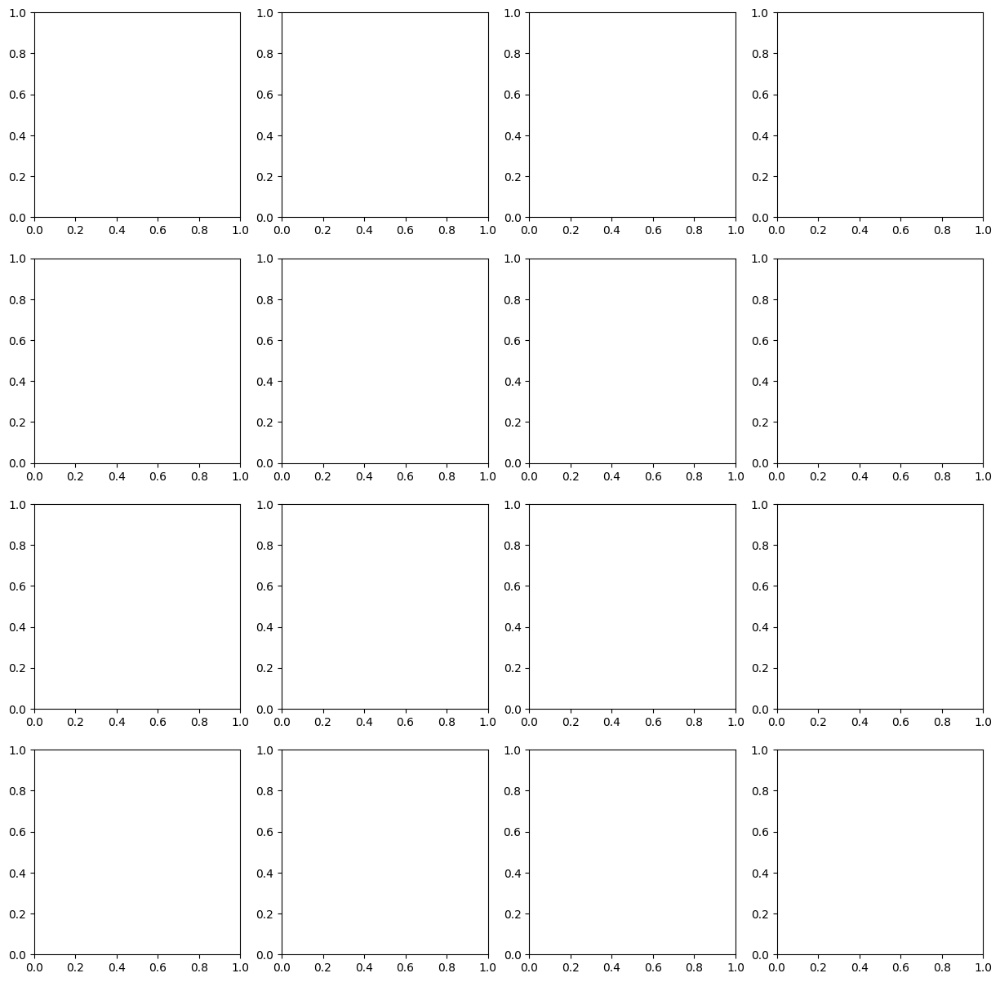

In [ ]:
compute_gradcam(model,'00000103_001.png',  mean, std, 'images/', df, labels, selected_labels)